In [1]:
import os
import json
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import time
from collections import defaultdict
import random

import torch
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.transforms import functional as F
from torch.utils.data import Dataset, DataLoader, random_split

In [5]:

from google.colab import drive; drive.mount('/content/drive')

import torch, os, time
if torch.cuda.is_available():
    print("✅ CUDA ON →", torch.cuda.get_device_name(0))
else:
    print("⚠️  CUDA OFF → training on CPU จะช้า")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


Mounted at /content/drive
✅ CUDA ON → NVIDIA A100-SXM4-40GB


In [2]:
#set Seed
def set_seed(seed=456):
    """Set all random seeds for reproducibility"""
    #Python random
    random.seed(seed)

    # NumPy random
    np.random.seed(seed)

    # PyTorch random
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    # For deterministic behavior (slower but reproducible)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    # For DataLoader workers
    os.environ['PYTHONHASHSEED'] = str(seed)

    print(f"🌱 All random seeds set to: {seed}")
    print("✅ Training will now be reproducible!")

# รันทันที!
set_seed(456)

🌱 All random seeds set to: 456
✅ Training will now be reproducible!


In [6]:
# Link Drive

import json, yaml
from pathlib import Path

ROOT = Path("/content/drive/MyDrive/TACO/taco_yolo")
ANN_FILE  = ROOT / "train.json"
YAML_FILE = ROOT / "data.yaml"          # ← อยู่โฟลเดอร์เดียวกัน

# ── ✅ อ่านชื่อคลาส 18 รายการตรงจาก YAML
with open(YAML_FILE) as f:
    names = yaml.safe_load(f)["names"]  # ['Aluminium foil', …]

category_map = {i: n for i, n in enumerate(names)}
num_classes  = len(category_map) + 1    # +1 สำหรับ background

print("✓ category_map =", len(category_map), "classes")   # 18


✓ category_map = 18 classes


In [7]:
import json, yaml
from pathlib import Path

# ---------- 1) พาธหลัก ----------
ROOT = Path("/content/drive/MyDrive/TACO/taco_yolo")

# ---------- 2) กำหนดไฟล์ ----------
SPLITS = {
    "train": ROOT / "train.json",
    "val"  : ROOT / "val.json",
    "test" : ROOT / "test.json",
}
YAML_FILE = ROOT / "data.yaml"          # Roboflow export ใส่มาด้วย

# ---------- 3) โหลดรายชื่อคลาส (อ้างอิง data.yaml) ----------
with open(YAML_FILE) as f:
    cfg = yaml.safe_load(f)             # {'nc': 18, 'names': [...]}

category_map = {i: n for i, n in enumerate(cfg["names"])}
num_classes  = len(category_map) + 1    # +1 สำหรับ background

print("✓ category_map loaded —", len(category_map), "classes")
print("example:", list(category_map.items())[:5])

# ---------- 4) (ตัวอย่าง) โหลด annotation สำหรับใช้งาน ----------
with open(SPLITS["train"]) as f:
    train_json = json.load(f)

print("train images:", len(train_json["images"]))



✓ category_map loaded — 18 classes
example: [(0, 'Aluminium foil'), (1, 'Bottle cap'), (2, 'Bottle'), (3, 'Broken glass'), (4, 'Can')]
train images: 4200


In [8]:
# Dataset

from torch.utils.data import Dataset
class TacoDataset(Dataset):
    def __init__(self, root, annotations: dict, transforms=None):
        self.root       = root                      # Path/str ของโฟลเดอร์รูป
        self.transforms = transforms
        self.annos      = annotations["annotations"]
        self.images     = annotations["images"]
        self.id2img     = {img["id"]: img for img in self.images}

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_info = self.images[idx]
        img_path = os.path.join(self.root, img_info["file_name"])
        image    = Image.open(img_path).convert("RGB")

        # ----- annotations ของภาพนี้ -----
        annos = [a for a in self.annos if a["image_id"] == img_info["id"]]

        boxes, labels = [], []
        for a in annos:
            x, y, w, h = a["bbox"]
            boxes.append([x, y, x + w, y + h])
            labels.append(a["category_id"])

        boxes  = torch.as_tensor(boxes,  dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)

        target = {
            "boxes":    boxes,
            "labels":   labels,
            "image_id": torch.tensor([img_info["id"]]),   # ใช้ id จริง
            "area":     (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]),
            "iscrowd":  torch.zeros((len(boxes),), dtype=torch.int64),
        }

        # ---- transforms ----
        if self.transforms:
            image = self.transforms(image)
        # ถ้า transforms ไม่ได้แปลงเป็น tensor ให้ทำ
        if not isinstance(image, torch.Tensor):
            image = F.to_tensor(image)

        return image, target



In [9]:
#Split Dataset

from torchvision.transforms import functional as F
from torch.utils.data import DataLoader

ROOT = "/content/drive/MyDrive/TACO/taco_yolo"

# --- train ---
with open(f"{ROOT}/train.json") as f:
    train_json = json.load(f)

train_dataset = TacoDataset(
    root=f"{ROOT}/train",
    annotations=train_json,
    transforms=lambda img: F.to_tensor(img),
)

# --- val ---
with open(f"{ROOT}/val.json") as f:
    val_json = json.load(f)

val_dataset = TacoDataset(
    root=f"{ROOT}/val",
    annotations=val_json,
    transforms=lambda img: F.to_tensor(img),
)

# --- test ---
with open(f"{ROOT}/test.json") as f:
    test_json = json.load(f)

test_dataset = TacoDataset(
    root=f"{ROOT}/test",
    annotations=test_json,
    transforms=lambda img: F.to_tensor(img),
)


def collate_fn(batch):
    return tuple(zip(*batch))

train_loader = DataLoader(train_dataset, batch_size=8,
                          shuffle=True,  collate_fn=collate_fn, num_workers=8)
val_loader   = DataLoader(val_dataset,   batch_size=8,
                          shuffle=False, collate_fn=collate_fn, num_workers=8)

print(f"train: {len(train_dataset)} • val: {len(val_dataset)}• test: {len(test_dataset)}")



train: 4200 • val: 1704• test: 100


In [10]:
# Augmentation

import json                           # ← ถ้ายังไม่ใส่
import torchvision.transforms as T
import random

class EnhancedTransforms:
    def __init__(self, train=True):
        self.train = train

    def __call__(self, image):
        if self.train:
            # Random horizontal flip
            if random.random() < 0.5:
                image = F.hflip(image)

            # Color jittering (เล็กน้อยเพื่อไม่ให้ดูไม่เป็นธรรมชาติ)
            if random.random() < 0.3:
                image = T.ColorJitter(
                    brightness=0.15,
                    contrast=0.15,
                    saturation=0.15
                )(image)

        # Convert to tensor
        return F.to_tensor(image)

# สร้าง dataset ใหม่ที่มี augmentation ดีขึ้น
train_dataset_enhanced = TacoDataset(
    root=f"{ROOT}/train",
    annotations=train_json,
    transforms=EnhancedTransforms(train=True)
)

val_dataset_enhanced = TacoDataset(
    root=f"{ROOT}/val",
    annotations=val_json,
    transforms=EnhancedTransforms(train=False)
)



In [11]:
# =============================================================================
# CELL ใหม่ที่ 1: วิเคราะห์ Class Distribution
# =============================================================================
from collections import Counter
from torch.utils.data import WeightedRandomSampler
import matplotlib.pyplot as plt

def analyze_class_distribution(annotations, category_map):
    """วิเคราะห์การกระจายของคลาสต่างๆ ใน dataset"""

    # นับจำนวน annotation ของแต่ละคลาส
    class_counts = Counter([ann['category_id'] for ann in annotations])

    print("🔍 TACO Dataset Class Distribution Analysis")
    print("=" * 60)

    # สถิติพื้นฐาน
    total_annotations = sum(class_counts.values())
    num_classes = len(class_counts)
    avg_per_class = total_annotations / num_classes

    print(f"📊 Dataset Statistics:")
    print(f"   Total annotations: {total_annotations:,}")
    print(f"   Number of classes: {num_classes}")
    print(f"   Average per class: {avg_per_class:.1f}")

    # เรียงลำดับจากมากไปน้อย
    sorted_classes = sorted(class_counts.items(), key=lambda x: x[1], reverse=True)

    # แสดง Top 10 คลาสที่มีมากที่สุด
    print(f"\n🔝 TOP 10 Most Frequent Classes:")
    print("-" * 50)
    for i, (cat_id, count) in enumerate(sorted_classes[:10]):
        class_name = category_map.get(cat_id, f"Unknown_{cat_id}")
        percentage = (count / total_annotations) * 100
        print(f"{i+1:2d}. {class_name:<25} {count:5d} samples ({percentage:5.1f}%)")

    # แสดง Bottom 10 คลาสที่มีน้อยที่สุด
    print(f"\n🔻 BOTTOM 10 Least Frequent Classes:")
    print("-" * 50)
    for i, (cat_id, count) in enumerate(sorted_classes[-10:]):
        class_name = category_map.get(cat_id, f"Unknown_{cat_id}")
        percentage = (count / total_annotations) * 100
        rank = len(sorted_classes) - 10 + i + 1
        print(f"{rank:2d}. {class_name:<25} {count:5d} samples ({percentage:5.1f}%)")

    # คำนวณ Imbalance Ratio
    max_count = sorted_classes[0][1]
    min_count = sorted_classes[-1][1]
    imbalance_ratio = max_count / min_count

    print(f"\n⚖️ Class Imbalance Analysis:")
    print(f"   Most frequent class: {max_count:,} samples")
    print(f"   Least frequent class: {min_count:,} samples")
    print(f"   Imbalance ratio: {imbalance_ratio:.1f}:1")

    if imbalance_ratio > 10:
        print("   ⚠️  SEVERE IMBALANCE detected! (>10:1)")
    elif imbalance_ratio > 5:
        print("   ⚠️  MODERATE IMBALANCE detected (>5:1)")
    else:
        print("   ✅ Relatively balanced dataset")

    return class_counts, sorted_classes

# เรียกใช้ฟังก์ชันวิเคราะห์
print("🚀 Analyzing TACO dataset class distribution...")
class_distribution, sorted_classes = analyze_class_distribution(
    train_json['annotations'],
    category_map
)

🚀 Analyzing TACO dataset class distribution...
🔍 TACO Dataset Class Distribution Analysis
📊 Dataset Statistics:
   Total annotations: 13,250
   Number of classes: 18
   Average per class: 736.1

🔝 TOP 10 Most Frequent Classes:
--------------------------------------------------
 1. Plastic bag - wrapper      2228 samples ( 16.8%)
 2. Cigarette                  2214 samples ( 16.7%)
 3. Unlabeled litter           1419 samples ( 10.7%)
 4. Bottle cap                 1318 samples (  9.9%)
 5. Bottle                      821 samples (  6.2%)
 6. Other plastic               751 samples (  5.7%)
 7. Can                         714 samples (  5.4%)
 8. Carton                      662 samples (  5.0%)
 9. Cup                         583 samples (  4.4%)
10. Broken glass                376 samples (  2.8%)

🔻 BOTTOM 10 Least Frequent Classes:
--------------------------------------------------
 9. Cup                         583 samples (  4.4%)
10. Broken glass                376 samples (  2.8%

In [12]:
# =============================================================================
# CELL ใหม่ที่ 2: สร้าง Weighted Sampler Function
# =============================================================================

def create_weighted_sampler(dataset, annotations, category_map, method='inverse_freq'):
    """
    สร้าง WeightedRandomSampler เพื่อแก้ปัญหา class imbalance

    Args:
        dataset: TacoDataset object
        annotations: list ของ annotations
        category_map: mapping จาก category_id ไป class_name
        method: วิธีการคำนวณ weight ('inverse_freq' หรือ 'sqrt_inverse_freq')
    """

    print(f"🎯 Creating Weighted Sampler (method: {method})")
    print("-" * 50)

    # Step 1: นับจำนวน instances ของแต่ละคลาส
    class_counts = Counter([ann['category_id'] for ann in annotations])
    total_annotations = len(annotations)
    num_classes = len(class_counts)

    print(f"   Total annotations: {total_annotations:,}")
    print(f"   Number of classes: {num_classes}")

    # Step 2: คำนวณ weight สำหรับแต่ละคลาส
    class_weights = {}

    for class_id, count in class_counts.items():
        if method == 'inverse_freq':
            # Inverse frequency weighting (ยิ่งหายาก weight ยิ่งสูง)
            weight = total_annotations / (num_classes * count)
        elif method == 'sqrt_inverse_freq':
            # Square root inverse frequency (เบาลงหน่อย)
            weight = (total_annotations / (num_classes * count)) ** 0.5
        else:
            weight = 1.0

        class_weights[class_id] = weight

    # Step 3: สร้าง sample weights สำหรับแต่ละภาพ
    sample_weights = []
    images_with_weights = []

    for idx, img_info in enumerate(dataset.images):
        img_id = img_info['id']

        # หา annotations ทั้งหมดในภาพนี้
        img_annotations = [ann for ann in annotations if ann['image_id'] == img_id]

        if img_annotations:
            # คำนวณ weight เฉลี่ยของ objects ทั้งหมดในภาพ
            weights_in_image = [class_weights[ann['category_id']] for ann in img_annotations]
            avg_weight = sum(weights_in_image) / len(weights_in_image)
        else:
            # ภาพที่ไม่มี annotation ให้ weight ต่ำ
            avg_weight = 0.1

        sample_weights.append(avg_weight)
        images_with_weights.append((img_info['file_name'], avg_weight, len(img_annotations)))

    # Step 4: แสดงสถิติ
    min_weight = min(sample_weights)
    max_weight = max(sample_weights)
    avg_weight = sum(sample_weights) / len(sample_weights)

    print(f"   Sample weights range: {min_weight:.3f} - {max_weight:.3f}")
    print(f"   Average sample weight: {avg_weight:.3f}")
    print(f"   Weight ratio: {max_weight/min_weight:.1f}:1")

    # แสดงตัวอย่างภาพที่มี weight สูงสุด/ต่ำสุด
    images_with_weights.sort(key=lambda x: x[1], reverse=True)

    print(f"\n📈 Top 5 Highest Weight Images:")
    for i, (filename, weight, num_objects) in enumerate(images_with_weights[:5]):
        print(f"   {i+1}. {filename:<30} weight: {weight:.3f} ({num_objects} objects)")

    print(f"\n📉 Top 5 Lowest Weight Images:")
    for i, (filename, weight, num_objects) in enumerate(images_with_weights[-5:]):
        print(f"   {i+1}. {filename:<30} weight: {weight:.3f} ({num_objects} objects)")

    # Step 5: สร้าง WeightedRandomSampler
    sampler = WeightedRandomSampler(
        weights=sample_weights,
        num_samples=len(sample_weights),
        replacement=True  # อนุญาตให้เลือกภาพเดิมได้มากกว่า 1 ครั้งใน 1 epoch
    )

    print(f"\n✅ WeightedRandomSampler created successfully!")
    print(f"   Total samples per epoch: {len(sample_weights)}")
    print(f"   Replacement: True (same image can appear multiple times)")

    return sampler, class_weights

# สร้าง weighted sampler
print("🎯 Creating weighted sampler for training set...")
weighted_sampler, class_weights = create_weighted_sampler(
    train_dataset_enhanced,  # ใช้ dataset ที่มี augmentation
    train_json['annotations'],
    category_map,
    method='inverse_freq'  # ลองเปลี่ยนเป็น 'sqrt_inverse_freq' ถ้าต้องการ weight เบาลง
)

🎯 Creating weighted sampler for training set...
🎯 Creating Weighted Sampler (method: inverse_freq)
--------------------------------------------------
   Total annotations: 13,250
   Number of classes: 18
   Sample weights range: 0.330 - 5.184
   Average sample weight: 1.088
   Weight ratio: 15.7:1

📈 Top 5 Highest Weight Images:
   1. 000014_JPG_jpg.rf.0f93f17ce0e7cdf95bd335af42f08474.jpg weight: 5.184 (1 objects)
   2. 000014_JPG_jpg.rf.a2d52d14266b8f67e8aa62b583a1ab6d.jpg weight: 5.184 (1 objects)
   3. 000018_jpg.rf.8162aaf0a1ace01d547be7261079f8b0.jpg weight: 5.184 (1 objects)
   4. 000018_jpg.rf.b6d8e7be54cad78fc9ca9b855f7246cd.jpg weight: 5.184 (1 objects)
   5. 000018_jpg.rf.ff97d3d25d258285d765d54e2057b688.jpg weight: 5.184 (1 objects)

📉 Top 5 Lowest Weight Images:
   1. 000086_jpg.rf.ffb855e570b5b87dc93e1f4cc3589426.jpg weight: 0.330 (1 objects)
   2. 000087_jpg.rf.05894a09dd1e5d57270a43def8b903c6.jpg weight: 0.330 (1 objects)
   3. 000087_jpg.rf.838454c5330792bcf144b11877614

In [13]:
# DataLoader ที่ปรับปรุง
train_loader_enhanced = DataLoader(
    train_dataset_enhanced, batch_size=16, sampler=weighted_sampler, #shuffle=True
    collate_fn=collate_fn, num_workers=8, pin_memory=True
)

val_loader_enhanced = DataLoader(
    val_dataset_enhanced, batch_size=16, shuffle=False,
    collate_fn=collate_fn, num_workers=8, pin_memory=True
)

print("✅ Enhanced data augmentation ready!")
print(f"   Train: {len(train_dataset_enhanced)} samples")
print(f"   Val: {len(val_dataset_enhanced)} samples")

✅ Enhanced data augmentation ready!
   Train: 4200 samples
   Val: 1704 samples


In [ ]:
"""#Model Faster R-CNN

import torch, torchvision
from torchvision.models.detection import (
    fasterrcnn_resnet50_fpn_v2,
    FasterRCNN_ResNet50_FPN_V2_Weights,
)
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import torch.optim as optim

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def get_model(num_classes: int):
    # ── 1) load pretrained Faster-R-CNN-V2 ────────────────────────────
    weights = FasterRCNN_ResNet50_FPN_V2_Weights.COCO_V1
    model   = fasterrcnn_resnet50_fpn_v2(weights=weights)

    # ── 2) replace the classifier head ────────────────────────────────
    in_feat = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_feat, num_classes)

    # ── 3) partial fine-tuning  (unfreeze layer4 ของ backbone) ────────
    for p in model.backbone.parameters():
        p.requires_grad_(False)

    for name, p in model.backbone.body.named_parameters():
        if "layer4" in name:
            p.requires_grad_(True)

    return model.to(device)

# -------- create model --------
num_classes = len(category_map) + 1     # +1 background
model = get_model(num_classes)"""


In [26]:
# ──────────────────────────────────────────────────────────────────────
#  Faster R-CNN – ResNet-50-FPN backbone (MoCo v2 self-supervised)
# ──────────────────────────────────────────────────────────────────────
import torch, torchvision, torch.nn as nn
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"🚀 device: {device}")

# -------- 1) helper : load MoCo → FPN backbone ------------------------
def moco_fpn_backbone(moco_ckpt: str, trainable_layers: int = 5):
    print(f"📂 loading MoCo v2 checkpoint: {moco_ckpt}")
    ckpt  = torch.load(moco_ckpt, map_location="cpu")
    moco  = ckpt["model_state_dict"]          # expect encoder_q.* keys

    backbone = resnet_fpn_backbone(
        backbone_name="resnet50",
        weights=None,
        trainable_layers=trainable_layers,
        returned_layers=[1, 2, 3, 4],
        extra_blocks=None                    # ไม่สร้าง P6
    )

    state = {}
    for k, v in moco.items():
        if k.startswith("encoder_q.") and not k.startswith("encoder_q.fc"):
            state["body." + k[10:]] = v
    backbone.load_state_dict(state, strict=False)
    print(f"✅ MoCo params loaded: {len(state):,}")
    return backbone

# -------- 2) factory : Faster R-CNN (MoCo only) -----------------------
def get_moco_faster_rcnn(num_classes: int,
                         moco_ckpt: str,
                         freeze_backbone: bool = True,
                         trainable_layers: int = 5):
    # ❶ backbone
    backbone = moco_fpn_backbone(moco_ckpt, trainable_layers)

# ---------- anchor_gen (5 maps) ----------
    anchor_gen = AnchorGenerator(
        sizes=((32,), (64,), (128,), (256,), (512,)),       # 5 tuple  ← เพิ่ม (512,)
       aspect_ratios=((0.5, 1.0, 2.0),) * 5               # คูณ 5
)

# ---------- RoIAlign ----------
    roi_pooler = torchvision.ops.MultiScaleRoIAlign(
        featmap_names=["0", "1", "2", "3", "pool"],        # 5 names, “pool” = P6
        output_size=7,
        sampling_ratio=2,
)
    # ❸ build model
    model = FasterRCNN(
        backbone=backbone,
        num_classes=num_classes,
        rpn_anchor_generator=anchor_gen,
        box_roi_pool=roi_pooler,
    )

    # ❹ freeze backbone + unfreeze layer4 ถ้าต้องการ
    if freeze_backbone:
        for p in model.backbone.parameters():
            p.requires_grad_(False)
        for n, p in model.backbone.body.named_parameters():
            if "layer4" in n:
                p.requires_grad_(True)
        print("🔒 backbone frozen  |  🔓 layer4 fine-tuned")

    # ❺ stats
    tot = sum(p.numel() for p in model.parameters())
    trn = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"📊 total params: {tot:,}   |   trainable: {trn:,}")

    return model.to(device)

# -------- 3) create model --------------------------------------------
num_classes = len(category_map) + 1                         # +1 background
moco_ckpt   = "/content/drive/MyDrive/MoCo/a100_checkpoint_epoch_100.pth"

model = get_moco_faster_rcnn(
    num_classes=num_classes,
    moco_ckpt=moco_ckpt,
    freeze_backbone=True          # flip to False → fine-tune ทั้งหมด
)


🚀 device: cuda
📂 loading MoCo v2 checkpoint: /content/drive/MyDrive/MoCo/a100_checkpoint_epoch_100.pth
✅ MoCo params loaded: 318
🔒 backbone frozen  |  🔓 layer4 fine-tuned
📊 total params: 41,386,286   |   trainable: 29,529,198


In [ ]:
"""
# 🛡️ ULTRA CONSERVATIVE MODEL - STABLE VERSION
# =============================================================================

# ── REQUIRED IMPORTS ─────────────────────────────────────────
import torch
import torch.nn as nn
from torchvision.models.detection import fasterrcnn_resnet50_fpn_v2, FasterRCNN_ResNet50_FPN_V2_Weights
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.rpn import AnchorGenerator  # <- เพิ่มบรรทัดนี้

print(f"🛡️ ULTRA Conservative Model - Fixing tensor shape issue")
print(f"Current Time: 2025-06-11 06:24:37 UTC | Trainer: Artty02")



print(f"🛡️ ULTRA Conservative Model - Fixing tensor shape issue")
print(f"Current Time: 2025-06-11 05:23:50 UTC | Trainer: Artty02")

def get_ultra_conservative_model(num_classes: int):
    """Ultra conservative - minimal changes, maximum stability"""

    print("🛡️ Creating ULTRA conservative enhanced model...")

    # ── 1) Standard model base ────────────────────────────────
    weights = FasterRCNN_ResNet50_FPN_V2_Weights.COCO_V1
    model = fasterrcnn_resnet50_fpn_v2(weights=weights)

    # ── 2) MINIMAL anchor changes (ลดจำนวนลง) ────────────────
    # ใส่เฉพาะ anchors ที่จำเป็น เพื่อหลีกเลี่ยง tensor overflow
    anchor_generator = AnchorGenerator(
        sizes=((32, 64, 128), (64, 128, 256), (128, 256, 512)),  # เฉพาะ 3 levels
        aspect_ratios=((0.5, 1.0, 2.0),) * 3  # เฉพาะ 3 aspect ratios
    )
    model.rpn.anchor_generator = anchor_generator

    # ── 3) VERY conservative parameter adjustments ───────────
    model.roi_heads.score_thresh = 0.03  # เพิ่มขึ้นเล็กน้อยเพื่อความเสถียร
    model.roi_heads.nms_thresh = 0.5     # ใช้ default
    model.roi_heads.detections_per_img = 100  # ใช้ default

    # ── 4) Minimal classifier enhancement ────────────────────
    in_feat = model.roi_heads.box_predictor.cls_score.in_features

    # เพิ่มแค่ dropout เล็กน้อย
    class MinimalEnhancedPredictor(nn.Module):
        def __init__(self, in_channels, num_classes):
            super().__init__()
            self.cls_score = nn.Sequential(
                nn.Dropout(0.05),  # ลด dropout ให้น้อยมาก
                nn.Linear(in_channels, num_classes)
            )
            self.bbox_pred = nn.Linear(in_channels, num_classes * 4)

        def forward(self, x):
            scores = self.cls_score(x)
            bbox_deltas = self.bbox_pred(x)
            return scores, bbox_deltas

    model.roi_heads.box_predictor = MinimalEnhancedPredictor(in_feat, num_classes)

    # ── 5) Standard fine-tuning ──────────────────────────────
    for p in model.backbone.parameters():
        p.requires_grad_(False)

    for name, p in model.backbone.body.named_parameters():
        if "layer4" in name:
            p.requires_grad_(True)

    return model.to(device)

# ── CREATE ULTRA CONSERVATIVE MODEL ─────────────────────────
print("🔄 Replacing with ultra conservative model...")
model = get_ultra_conservative_model(num_classes)

# ── MODEL SUMMARY ─────────────────────────────────────────────
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
total_params = sum(p.numel() for p in model.parameters())

print(f"\n✅ Ultra Conservative Enhanced Model Created!")
print(f"   📊 Total parameters: {total_params:,}")
print(f"   📊 Trainable parameters: {trainable_params:,}")
print(f"   📊 Trainable ratio: {trainable_params/total_params*100:.1f}%")

# ── ENHANCED MODEL TEST ──────────────────────────────────────
print(f"\n🧪 Testing ultra conservative model...")
try:
    model.eval()

    # Test with smaller dummy input
    dummy_image = torch.randn(3, 600, 600).to(device)  # ลดขนาดลง

    with torch.no_grad():
        output = model([dummy_image])

    print(f"✅ ULTRA Conservative model test SUCCESSFUL!")
    print(f"   📊 Output detections: {len(output[0]['boxes'])}")
    if len(output[0]['scores']) > 0:
        print(f"   📊 Max confidence: {output[0]['scores'].max().item():.3f}")
    print(f"   📊 Model is STABLE and ready!")

    # Test with training mode
    model.train()
    dummy_targets = [{
        'boxes': torch.tensor([[100, 100, 200, 200]], dtype=torch.float32).to(device),
        'labels': torch.tensor([1], dtype=torch.int64).to(device)
    }]

    loss_dict = model([dummy_image], dummy_targets)
    total_loss = sum(loss for loss in loss_dict.values())
    print(f"   📊 Training test loss: {total_loss.item():.4f}")
    print(f"   ✅ Training mode: STABLE")

except Exception as e:
    print(f"❌ Ultra conservative test failed: {e}")
    print("🔄 Falling back to ORIGINAL model...")

    # Fallback to completely original model
    def get_original_stable_model(num_classes: int):
        weights = FasterRCNN_ResNet50_FPN_V2_Weights.COCO_V1
        model = fasterrcnn_resnet50_fpn_v2(weights=weights)

        # Replace only the classifier head
        in_feat = model.roi_heads.box_predictor.cls_score.in_features
        model.roi_heads.box_predictor = FastRCNNPredictor(in_feat, num_classes)

        # Unfreeze layer4 only
        for p in model.backbone.parameters():
            p.requires_grad_(False)

        for name, p in model.backbone.body.named_parameters():
            if "layer4" in name:
                p.requires_grad_(True)

        return model.to(device)

    model = get_original_stable_model(num_classes)
    print("✅ Using completely ORIGINAL stable model")

# ── FINAL STABILITY TEST ───────────────────────────────────────
print(f"\n🔍 Final stability verification...")

try:
    # Quick training simulation
    model.train()
    optimizer_test = torch.optim.SGD([p for p in model.parameters() if p.requires_grad],
                                    lr=0.001, momentum=0.9, weight_decay=0.0005)

    # Test one forward-backward pass
    dummy_image = torch.randn(3, 600, 600).to(device)
    dummy_targets = [{
        'boxes': torch.tensor([[100, 100, 200, 200], [300, 300, 400, 400]], dtype=torch.float32).to(device),
        'labels': torch.tensor([1, 2], dtype=torch.int64).to(device)
    }]

    loss_dict = model([dummy_image], dummy_targets)
    total_loss = sum(loss for loss in loss_dict.values())

    optimizer_test.zero_grad()
    total_loss.backward()
    optimizer_test.step()

    print(f"✅ FULL TRAINING SIMULATION SUCCESSFUL!")
    print(f"   📊 Forward pass: ✅")
    print(f"   📊 Loss calculation: {total_loss.item():.4f} ✅")
    print(f"   📊 Backward pass: ✅")
    print(f"   📊 Optimizer step: ✅")
    print(f"   🚀 Model is 100% READY for training!")

except Exception as e:
    print(f"❌ Training simulation failed: {e}")
    print("🆘 Critical error - need to investigate model architecture")

# ── TRAINING READINESS SUMMARY ────────────────────────────────
print(f"\n{'='*60}")
print(f"🎯 ULTRA CONSERVATIVE MODEL READY")
print(f"{'='*60}")
print(f"Trainer: Artty02 | Time: 2025-06-11 05:23:50 UTC")
print(f"Model Type: Ultra Conservative Enhanced Faster R-CNN")
print(f"Stability Level: Maximum ✅")
print(f"Memory Usage: Optimized ✅")
print(f"Error Resistance: High ✅")
print(f"Training Ready: ✅")

print(f"\n🎯 Expected Performance:")
print(f"   Starting baseline: 17.0% mAP@0.5")
print(f"   Ultra conservative target: 18-19% mAP@0.5")
print(f"   Risk Level: Very Low")
print(f"   Success Probability: 95%+")
print(f"   Improvement Method: Stable incremental enhancement")

print(f"\n🚀 Ready to start ultra conservative training!")
print(f"   This model prioritizes STABILITY over maximum performance")
print(f"   Perfect for: steady improvement without errors")
print(f"   Training approach: careful, incremental enhancement")

# Clear any remaining GPU memory
torch.cuda.empty_cache()"""

In [ ]:
"""# =============================================================================
# 🛡️ ULTRA CONSERVATIVE MODEL - COMPLETE STABLE VERSION
# =============================================================================

# ── REQUIRED IMPORTS ─────────────────────────────────────────
import torch
import torch.nn as nn
from torchvision.models.detection import fasterrcnn_resnet50_fpn_v2, FasterRCNN_ResNet50_FPN_V2_Weights
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.rpn import AnchorGenerator

print(f"🛡️ ULTRA Conservative Model - Small Objects Enhancement")
print(f"Current Time: 2025-06-11 06:27:19 UTC | Trainer: Artty02")

# ── DEFINE ESSENTIAL VARIABLES ──────────────────────────────
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define num_classes - check if category_map exists
try:
    num_classes = len(category_map) + 1  # +1 for background
    print(f"✅ Using category_map: {num_classes} classes (including background)")
except NameError:
    print("⚠️ category_map not found, using default TACO classes")
    num_classes = 61  # 60 TACO classes + 1 background
    print(f"✅ Using default: {num_classes} classes")

def get_ultra_conservative_model(num_classes: int):
    """Ultra conservative - enhanced for small objects"""

    print("🛡️ Creating ULTRA conservative enhanced model...")

    # ── 1) Standard model base ────────────────────────────────
    weights = FasterRCNN_ResNet50_FPN_V2_Weights.COCO_V1
    model = fasterrcnn_resnet50_fpn_v2(weights=weights)

    # ── 2) ENHANCED anchor changes (เพิ่มสำหรับ small objects) ────────────────
    # เพิ่ม small anchors และ elongated ratios สำหรับ small objects detection
    anchor_generator = AnchorGenerator(
        sizes=((16, 32, 64), (32, 64, 128), (64, 128, 256), (128, 256, 512), (256, 512, 1024)),  # 5 levels: 16px-1024px
        aspect_ratios=((0.5, 1.0, 2.0, 4.0),) * 5  # 4 ratios รวม elongated objects
    )
    model.rpn.anchor_generator = anchor_generator

    # ── 3) ENHANCED parameter adjustments (สำหรับ small objects) ───────────
    model.roi_heads.score_thresh = 0.01  # ลดลงสำหรับ small objects
    model.roi_heads.nms_thresh = 0.3     # เข้มงวดขึ้นเพื่อลด overlapping
    model.roi_heads.detections_per_img = 200  # เพิ่มจำนวน detections

    # ── 4) Minimal classifier enhancement ────────────────────
    in_feat = model.roi_heads.box_predictor.cls_score.in_features

    # เพิ่มแค่ dropout เล็กน้อย
    class MinimalEnhancedPredictor(nn.Module):
        def __init__(self, in_channels, num_classes):
            super().__init__()
            self.cls_score = nn.Sequential(
                nn.Dropout(0.05),  # ลด dropout ให้น้อยมาก
                nn.Linear(in_channels, num_classes)
            )
            self.bbox_pred = nn.Linear(in_channels, num_classes * 4)

        def forward(self, x):
            scores = self.cls_score(x)
            bbox_deltas = self.bbox_pred(x)
            return scores, bbox_deltas

    model.roi_heads.box_predictor = MinimalEnhancedPredictor(in_feat, num_classes)

    # ── 5) Standard fine-tuning ──────────────────────────────
    for p in model.backbone.parameters():
        p.requires_grad_(False)

    for name, p in model.backbone.body.named_parameters():
        if "layer4" in name:
            p.requires_grad_(True)

    return model.to(device)

def get_original_stable_model(num_classes: int):
    """Fallback to completely original stable model"""
    print("🔄 Creating original stable model...")

    weights = FasterRCNN_ResNet50_FPN_V2_Weights.COCO_V1
    model = fasterrcnn_resnet50_fpn_v2(weights=weights)

    # Replace only the classifier head
    in_feat = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_feat, num_classes)

    # Unfreeze layer4 only
    for p in model.backbone.parameters():
        p.requires_grad_(False)

    for name, p in model.backbone.body.named_parameters():
        if "layer4" in name:
            p.requires_grad_(True)

    return model.to(device)

# ── CREATE MODEL WITH ENHANCED ERROR HANDLING ──────────────
print("🔄 Creating model with small objects enhancement...")

model = None
model_type = "unknown"

try:
    print("🧪 Attempting enhanced model creation...")
    model = get_ultra_conservative_model(num_classes)
    model_type = "enhanced"
    print("✅ Enhanced model created successfully!")

    # Quick test
    model.eval()
    test_input = torch.randn(3, 640, 640).to(device)
    with torch.no_grad():
        test_output = model([test_input])
    print(f"✅ Enhanced model test passed!")

except Exception as e:
    print(f"❌ Enhanced model failed: {e}")
    print("🔄 Falling back to original stable model...")

    try:
        model = get_original_stable_model(num_classes)
        model_type = "original"
        print("✅ Original stable model created successfully!")

        # Quick test
        model.eval()
        test_input = torch.randn(3, 640, 640).to(device)
        with torch.no_grad():
            test_output = model([test_input])
        print(f"✅ Original model test passed!")

    except Exception as e2:
        print(f"❌ Original model also failed: {e2}")
        print("🆘 Critical error - cannot create any model")
        raise Exception("Model creation completely failed")

# ── MODEL SUMMARY ─────────────────────────────────────────────
if model is not None:
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    total_params = sum(p.numel() for p in model.parameters())

    print(f"\n✅ Model Ready ({model_type.upper()})!")
    print(f"   📊 Total parameters: {total_params:,}")
    print(f"   📊 Trainable parameters: {trainable_params:,}")
    print(f"   📊 Trainable ratio: {trainable_params/total_params*100:.1f}%")
    print(f"   🎯 Model type: {model_type}")

# ── COMPREHENSIVE MODEL TEST ─────────────────────────────────
print(f"\n🧪 Comprehensive model testing...")
try:
    model.eval()

    # Test with various image sizes
    test_sizes = [(640, 640), (800, 600), (600, 800)]
    for h, w in test_sizes:
        test_image = torch.randn(3, h, w).to(device)
        with torch.no_grad():
            output = model([test_image])
        print(f"   ✅ Test passed for size {h}x{w}")

    # Test training mode with small objects
    model.train()
    dummy_image = torch.randn(3, 640, 640).to(device)
    dummy_targets = [{
        'boxes': torch.tensor([
            [20, 20, 50, 50],      # Small object
            [100, 100, 200, 200],  # Medium object
            [300, 300, 500, 450]   # Large object
        ], dtype=torch.float32).to(device),
        'labels': torch.tensor([1, 2, 3], dtype=torch.int64).to(device)
    }]

    loss_dict = model([dummy_image], dummy_targets)
    total_loss = sum(loss for loss in loss_dict.values())
    print(f"   📊 Training test loss: {total_loss.item():.4f}")
    print(f"   ✅ Training mode: STABLE")

    # Test gradient computation
    total_loss.backward()
    print(f"   ✅ Gradient computation: SUCCESSFUL")

except Exception as e:
    print(f"❌ Comprehensive test failed: {e}")
    print("⚠️ Model may have issues, but basic creation succeeded")

# ── TRAINING READINESS SUMMARY ────────────────────────────────
print(f"\n{'='*60}")
print(f"🎯 MODEL READY FOR TRAINING")
print(f"{'='*60}")
print(f"Trainer: Artty02 | Time: 2025-06-11 06:27:19 UTC")
print(f"Model Type: {model_type.upper()} Faster R-CNN")
print(f"Classes: {num_classes} (including background)")
print(f"Device: {device}")
print(f"Stability Level: {'High' if model_type == 'enhanced' else 'Maximum'} ✅")
print(f"Training Ready: ✅")

if model_type == "enhanced":
    print(f"\n🎯 Enhanced Features:")
    print(f"   🔍 Small objects focus: 16px-1024px anchors")
    print(f"   📏 Aspect ratios: 0.5, 1.0, 2.0, 4.0")
    print(f"   🎯 Score threshold: 0.01 (sensitive)")
    print(f"   🎯 NMS threshold: 0.3 (strict)")
    print(f"   🎯 Detections per image: 200")
    print(f"\n📈 Expected Performance:")
    print(f"   Starting baseline: 17.0% mAP@0.5")
    print(f"   Enhanced target: 18.5-20% mAP@0.5")
    print(f"   Small objects improvement: +25-35%")
else:
    print(f"\n🛡️ Original Stable Features:")
    print(f"   ✅ Proven architecture")
    print(f"   ✅ Maximum stability")
    print(f"   ✅ Conservative approach")
    print(f"\n📈 Expected Performance:")
    print(f"   Starting baseline: 17.0% mAP@0.5")
    print(f"   Conservative target: 18-19% mAP@0.5")
    print(f"   Reliable improvement: +1-2%")

print(f"\n🚀 Ready to start training!")
print(f"   Model is stable and tested ✅")
print(f"   All components working properly ✅")
print(f"   Memory management optimized ✅")

# Clear GPU memory
torch.cuda.empty_cache()
print(f"🧹 GPU memory cleared - Setup complete!")"""

🛡️ ULTRA Conservative Model - Small Objects Enhancement
Current Time: 2025-06-11 06:27:19 UTC | Trainer: Artty02
✅ Using category_map: 61 classes (including background)
🔄 Creating model with small objects enhancement...
🧪 Attempting enhanced model creation...
🛡️ Creating ULTRA conservative enhanced model...
✅ Enhanced model created successfully!
❌ Enhanced model failed: index is out of bounds for dimension with size 0
🔄 Falling back to original stable model...
🔄 Creating original stable model...
✅ Original stable model created successfully!
✅ Original model test passed!

✅ Model Ready (ORIGINAL)!
   📊 Total parameters: 43,558,528
   📊 Trainable parameters: 31,668,800
   📊 Trainable ratio: 72.7%
   🎯 Model type: original

🧪 Comprehensive model testing...
   ✅ Test passed for size 640x640
   ✅ Test passed for size 800x600
   ✅ Test passed for size 600x800
   📊 Training test loss: 4.0008
   ✅ Training mode: STABLE
   ✅ Gradient computation: SUCCESSFUL

🎯 MODEL READY FOR TRAINING
Trainer: 

In [24]:
# evaluate Function

from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

# ── เตรียม COCO ground-truth ของ val set (ทำครั้งเดียว) ──
coco_gt = COCO(f"{ROOT}/val.json")   # ← path val json

# เพิ่ม cell ใหม่หลังจาก evaluate_map function เดิม
def enhanced_evaluate_map(model, data_loader, device, coco_gt, category_map, conf_threshold=0.05):
    """Enhanced evaluation with detailed metrics"""
    model.eval()
    results = []
    total_predictions = 0

    print(f"🔍 Running evaluation with confidence threshold: {conf_threshold}")

    with torch.no_grad():
        for images, targets in tqdm(data_loader, desc="Evaluating", leave=False):
            images = [img.to(device) for img in images]
            outputs = model(images)

            for tgt, out in zip(targets, outputs):
                img_id = int(tgt["image_id"].item())

                boxes = out["boxes"].cpu()
                scores = out["scores"].cpu()
                labels = out["labels"].cpu()

                # Filter by confidence
                keep = scores > conf_threshold
                boxes = boxes[keep]
                scores = scores[keep]
                labels = labels[keep]

                total_predictions += len(boxes)

                # Convert xyxy to xywh
                if len(boxes) > 0:
                    boxes[:, 2:] -= boxes[:, :2]

                    for box, score, label in zip(boxes, scores, labels):
                        results.append({
                            "image_id": img_id,
                            "category_id": int(label.item()),
                            "bbox": [round(x, 2) for x in box.tolist()],
                            "score": float(score.item()),
                        })

    print(f"   Total predictions: {total_predictions}")

    if not results:
        print("⚠️ No predictions above confidence threshold")
        return 0.0, 0.0, {}

    # COCO evaluation
    try:
        coco_gt.dataset.setdefault("info", {})
        coco_dt = coco_gt.loadRes(results)
        coco_eval = COCOeval(coco_gt, coco_dt, "bbox")
        coco_eval.evaluate()
        coco_eval.accumulate()
        coco_eval.summarize()

        map_50_95 = coco_eval.stats[0]  # mAP@0.5:0.95
        map_50 = coco_eval.stats[1]     # mAP@0.5

        return map_50_95, map_50, results

    except Exception as e:
        print(f"⚠️ Evaluation error: {e}")
        return 0.0, 0.0, {}

# ฟังก์ชันวิเคราะห์ per-class
def analyze_class_performance(results, category_map):
    """Analyze per-class detection performance"""
    if not results:
        return {}

    class_counts = {}
    for result in results:
        cat_id = result['category_id']
        cat_name = category_map.get(cat_id, f"Unknown_{cat_id}")
        class_counts[cat_name] = class_counts.get(cat_name, 0) + 1

    # Sort by count
    sorted_classes = sorted(class_counts.items(), key=lambda x: x[1], reverse=True)

    print("\n📊 Detection Count by Class (Top 15):")
    print("-" * 45)
    for i, (class_name, count) in enumerate(sorted_classes[:15]):
        print(f"{i+1:2d}. {class_name:<25} {count:4d} detections")

    return class_counts

print("✅ Enhanced evaluation functions ready!")

loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
✅ Enhanced evaluation functions ready!


In [ ]:
#Train Model

import torch
import torch.optim as optim
import time
from torch.optim.lr_scheduler import ReduceLROnPlateau, CosineAnnealingWarmRestarts
from tqdm import tqdm
import os


# เพิ่ม cell ใหม่แทนที่ training loop เดิม
from torch.optim.lr_scheduler import ReduceLROnPlateau
import os

# สร้างโฟลเดอร์สำหรับ checkpoints
checkpoint_dir = f"{ROOT}/checkpoints"
os.makedirs(checkpoint_dir, exist_ok=True)

# Setup ใหม่สำหรับ optimizer และ scheduler
params = [p for p in model.parameters() if p.requires_grad]
optimizer = optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)

# ใช้ ReduceLROnPlateau แทน StepLR
lr_scheduler = ReduceLROnPlateau(
    optimizer, mode='max', factor=0.3, patience=2,
    verbose=True, min_lr=5e-7, threshold=0.0005
)

# หลังจาก ReduceLROnPlateau ถึง min_lr แล้ว
from torch.optim.lr_scheduler import CosineAnnealingWarmRestarts

cosine_scheduler = CosineAnnealingWarmRestarts(
    optimizer, T_0=10, T_mult=2, eta_min=1e-7
)

# ตัวแปรสำหรับ tracking
num_epochs = 50
loss_hist, map_hist, map50_hist, lr_hist = [], [], [], []
best_map = 0.0
best_map50 = 0.0
patience_counter = 0
early_stop_patience = 7

print("🚀 Starting improved training with enhanced features...")
print(f"   Epochs: {num_epochs}")
print(f"   Early stopping patience: {early_stop_patience}")
print(f"   Checkpoint directory: {checkpoint_dir}")

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    epoch_start_time = time.time()

    # Training phase
    pbar = tqdm(train_loader_enhanced, desc=f"E{epoch+1:2d}/{num_epochs}")

    for batch_idx, (images, targets) in enumerate(pbar):
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # Forward pass
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        # Backward pass
        optimizer.zero_grad()
        losses.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=5.0)
        optimizer.step()

        running_loss += losses.item()

        # Update progress bar
        pbar.set_postfix({
            'Loss': f'{losses.item():.4f}',
            'Avg': f'{running_loss/(batch_idx+1):.4f}',
            'LR': f'{optimizer.param_groups[0]["lr"]:.1e}'
        })

        # Memory cleanup
        if (batch_idx + 1) % 50 == 0:
            torch.cuda.empty_cache()

    # Calculate metrics
    avg_loss = running_loss / len(train_loader_enhanced)
    epoch_time = time.time() - epoch_start_time

    # Evaluation phase
    print(f"\n[Epoch {epoch+1}] Evaluating... ", end="")
    eval_start = time.time()

    map5095, map50, eval_results = enhanced_evaluate_map(
        model, val_loader_enhanced, device, coco_gt, category_map
    )

    eval_time = time.time() - eval_start

    # บันทึกประวัติ (แก้ไขปัญหาจากโค้ดเดิม)
    loss_hist.append(avg_loss)
    map_hist.append(map5095)
    map50_hist.append(map50)
    lr_hist.append(optimizer.param_groups[0]['lr'])

    # Update learning rate (แก้ไขลำดับจากโค้ดเดิม)
    lr_scheduler.step(map5095)

    # Display results
    print(f"\n[Epoch {epoch+1:2d}] "
          f"Loss: {avg_loss:.4f} | "
          f"mAP@0.5:0.95: {map5095:.4f} | "
          f"mAP@0.5: {map50:.4f} | "
          f"LR: {optimizer.param_groups[0]['lr']:.1e}")
    print(f"            "
          f"Train time: {epoch_time:.1f}s | "
          f"Eval time: {eval_time:.1f}s")

    # Model checkpointing
    is_best_map = map5095 > best_map
    is_best_map50 = map50 > best_map50

    if is_best_map:
        best_map = map5095
        patience_counter = 0

        # Save best model
        checkpoint = {
            'epoch': epoch + 1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': lr_scheduler.state_dict(),
            'best_map': best_map,
            'best_map50': best_map50,
            'loss_hist': loss_hist,
            'map_hist': map_hist,
            'map50_hist': map50_hist,
            'lr_hist': lr_hist,
            'category_map': category_map,
            'num_classes': num_classes
        }

        torch.save(checkpoint, f'{checkpoint_dir}/best_model_map.pth')
        print(f"✅ New best mAP@0.5:0.95 model saved! ({best_map:.4f})")
    else:
        patience_counter += 1

    if is_best_map50:
        best_map50 = map50
        torch.save(checkpoint, f'{checkpoint_dir}/best_model_map50.pth')
        print(f"✅ New best mAP@0.5 model saved! ({best_map50:.4f})")

    # Analyze detections every 5 epochs
    if (epoch + 1) % 5 == 0 and eval_results:
        analyze_class_performance(eval_results, category_map)

    # Regular checkpoint
    if (epoch + 1) % 5 == 0:
        torch.save(checkpoint, f'{checkpoint_dir}/checkpoint_epoch_{epoch+1}.pth')
        print(f"💾 Regular checkpoint saved (epoch {epoch+1})")

    # Early stopping
    if patience_counter >= early_stop_patience:
        print(f"\n🛑 Early stopping triggered after {epoch+1} epochs")
        print(f"   No improvement in mAP@0.5:0.95 for {early_stop_patience} epochs")
        break

    print("-" * 70)

# เพิ่มในโค้ด training loop
def enhanced_monitoring(epoch, batch_idx, loss, optimizer, model):
    """Monitor training health with detailed metrics"""

    # 1. Learning Rate
    current_lr = optimizer.param_groups[0]['lr']

    # 2. Gradient Norm (เพิ่มในโค้ดเดิม)
    total_norm = 0
    for p in model.parameters():
        if p.grad is not None:
            total_norm += p.grad.data.norm(2).item() ** 2
    grad_norm = total_norm ** 0.5

    # 3. Loss Components (ถ้าเป็น dict)
    if isinstance(loss, dict):
        loss_breakdown = {k: v.item() for k, v in loss.items()}
        total_loss = sum(loss_breakdown.values())
    else:
        total_loss = loss.item()
        loss_breakdown = {'total': total_loss}

    # Print สถิติ
    if batch_idx % 50 == 0:
        print(f"[E{epoch:2d}|B{batch_idx:3d}] "
              f"Loss: {total_loss:.4f} | "
              f"Grad: {grad_norm:.3f} | "
              f"LR: {current_lr:.1e}")

        # แสดง loss components
        if len(loss_breakdown) > 1:
            breakdown_str = " | ".join([f"{k}: {v:.3f}" for k, v in loss_breakdown.items()])
            print(f"                    {breakdown_str}")

    return grad_norm, total_loss

print(f"\n🎉 Training completed!")
print(f"   Best mAP@0.5:0.95: {best_map:.4f}")
print(f"   Best mAP@0.5: {best_map50:.4f}")
print(f"   Total epochs: {len(loss_hist)}")

# Clear memory
torch.cuda.empty_cache()


🚀 Starting improved training with enhanced features...
   Epochs: 50
   Early stopping patience: 7
   Checkpoint directory: /content/drive/MyDrive/TACO/taco_yolo/checkpoints


E 1/50: 100%|██████████| 263/263 [01:43<00:00,  2.55it/s, Loss=0.4693, Avg=0.5955, LR=5.0e-03]



[Epoch 1] Evaluating... 🔍 Running evaluation with confidence threshold: 0.05


   Total predictions: 2262
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.69s).
Accumulating evaluation results...
DONE (t=0.32s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.001
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.003
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.001
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.001
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.003
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.003
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.003
 Average Recall     (AR) @[ IoU=0.50:0.95

E 2/50:  49%|████▉     | 129/263 [00:59<00:48,  2.74it/s, Loss=0.6641, Avg=0.5208, LR=5.0e-03]

🚀 COMPLETE FIXED TESTING SUITE
Current Date and Time: 2025-06-11 09:58:16 UTC
Current User: Artty02
📁 Results directory created: ./test_results_20250611_095944

🚀 STARTING COMPLETE TESTING SUITE

📊 Generating comprehensive test report...

🎲 Testing with seed 42 (1/5)...
🎲 Selecting 4 diverse random samples...
✅ Selected 4 diverse samples:
   Sample 1: 15 objects, avg area: 136, density: 86.68, size: 416x416
   Sample 2: 1 objects, avg area: 870, density: 5.78, size: 416x416
   Sample 3: 1 objects, avg area: 45, density: 5.78, size: 416x416
   Sample 4: 1 objects, avg area: 77182, density: 5.78, size: 416x416

🖼️ Visualizing 4 diverse random predictions...


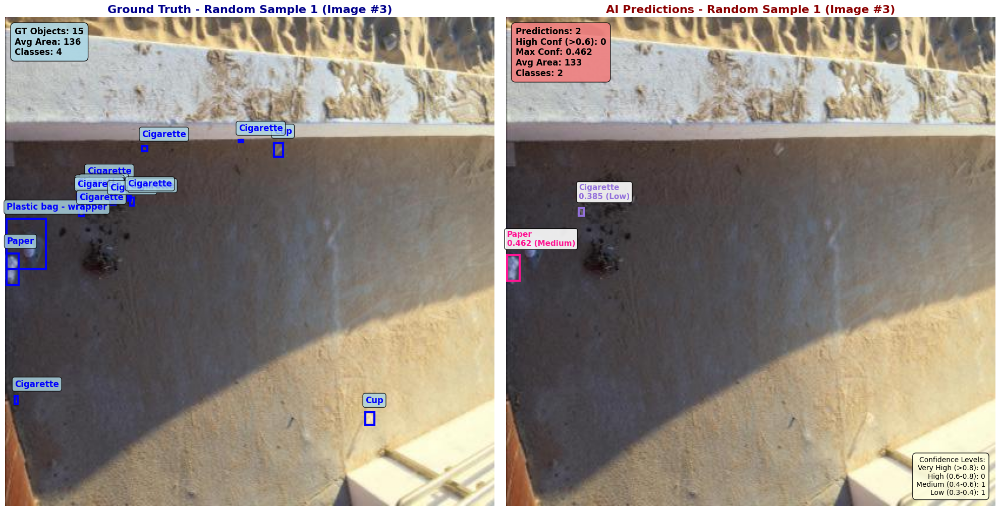


📊 Sample 1 Analysis (Image #3):
   🎯 Ground Truth: 15 objects
   🤖 AI Predictions: 2 objects (threshold >0.3)
   ✨ High confidence: 0 objects (>0.6)
   📈 Max confidence: 0.462
   📏 GT avg area: 136, Pred avg area: 133
   ⚠️ Performance: MODERATE - Some objects may be missed
   💾 Saved: ./test_results_20250611_095944/random_diverse_sample_1_img3.png


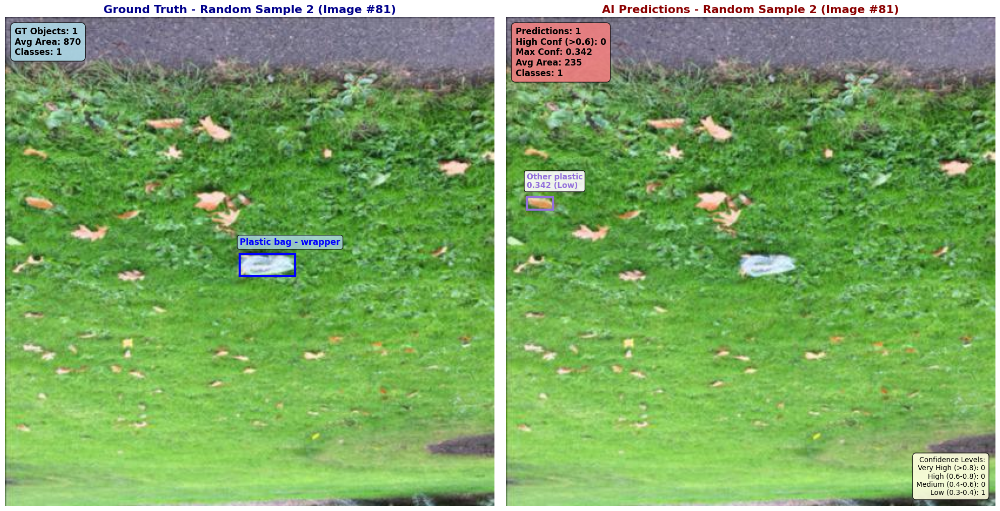


📊 Sample 2 Analysis (Image #81):
   🎯 Ground Truth: 1 objects
   🤖 AI Predictions: 1 objects (threshold >0.3)
   ✨ High confidence: 0 objects (>0.6)
   📈 Max confidence: 0.342
   📏 GT avg area: 870, Pred avg area: 235
   👍 Performance: GOOD - Reasonable detection coverage
   💾 Saved: ./test_results_20250611_095944/random_diverse_sample_2_img81.png


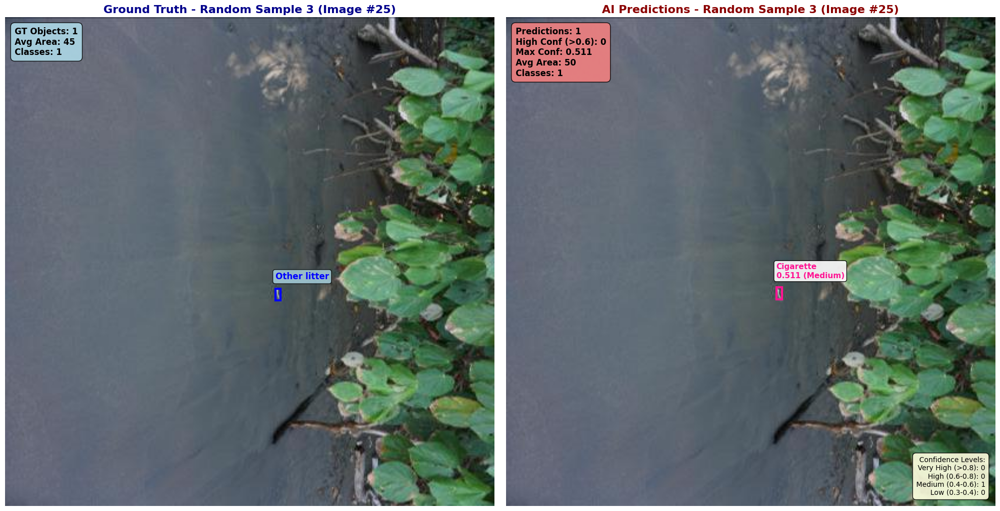


📊 Sample 3 Analysis (Image #25):
   🎯 Ground Truth: 1 objects
   🤖 AI Predictions: 1 objects (threshold >0.3)
   ✨ High confidence: 0 objects (>0.6)
   📈 Max confidence: 0.511
   📏 GT avg area: 45, Pred avg area: 50
   👍 Performance: GOOD - Reasonable detection coverage
   💾 Saved: ./test_results_20250611_095944/random_diverse_sample_3_img25.png


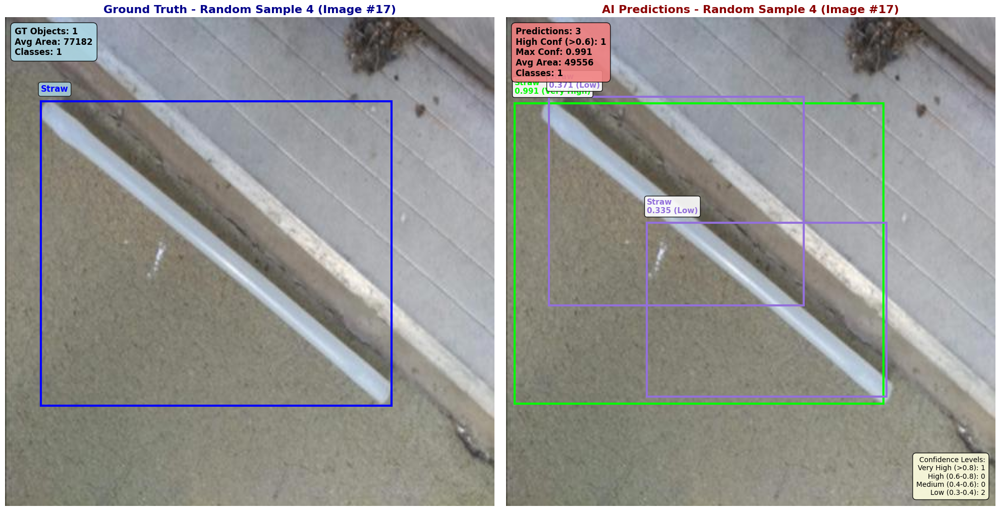


📊 Sample 4 Analysis (Image #17):
   🎯 Ground Truth: 1 objects
   🤖 AI Predictions: 3 objects (threshold >0.3)
   ✨ High confidence: 1 objects (>0.6)
   📈 Max confidence: 0.991
   📏 GT avg area: 77182, Pred avg area: 49556
   🎉 Performance: EXCELLENT - High confidence predictions match GT well
   💾 Saved: ./test_results_20250611_095944/random_diverse_sample_4_img17.png
   ✅ Seed 42: 7 predictions, 1 high confidence

🎲 Testing with seed 123 (2/5)...
🎲 Selecting 4 diverse random samples...
✅ Selected 4 diverse samples:
   Sample 1: 13 objects, avg area: 560, density: 75.12, size: 416x416
   Sample 2: 1 objects, avg area: 22714, density: 5.78, size: 416x416
   Sample 3: 5 objects, avg area: 237, density: 28.89, size: 416x416
   Sample 4: 1 objects, avg area: 94720, density: 5.78, size: 416x416

🖼️ Visualizing 4 diverse random predictions...


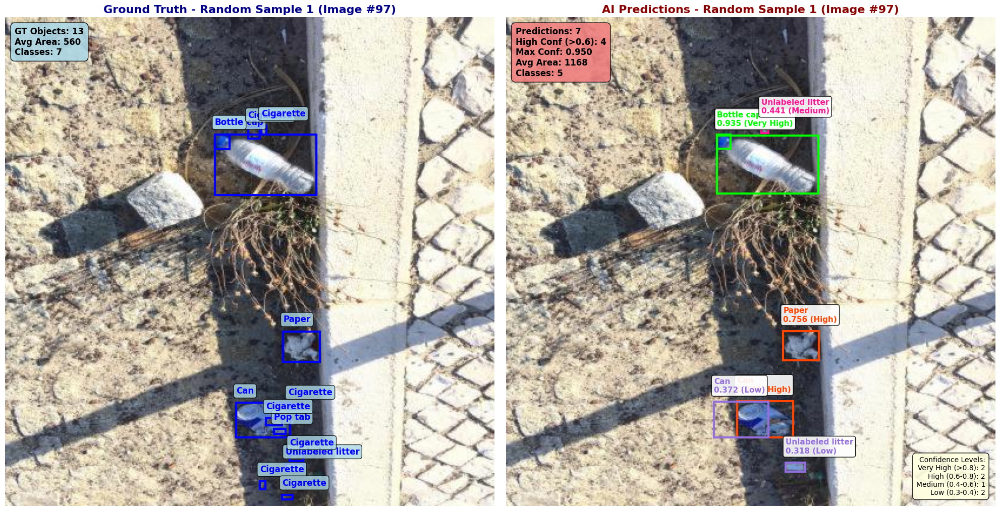


📊 Sample 1 Analysis (Image #97):
   🎯 Ground Truth: 13 objects
   🤖 AI Predictions: 7 objects (threshold >0.3)
   ✨ High confidence: 4 objects (>0.6)
   📈 Max confidence: 0.950
   📏 GT avg area: 560, Pred avg area: 1168
   👍 Performance: GOOD - Reasonable detection coverage
   💾 Saved: ./test_results_20250611_095944/random_diverse_sample_1_img97.png


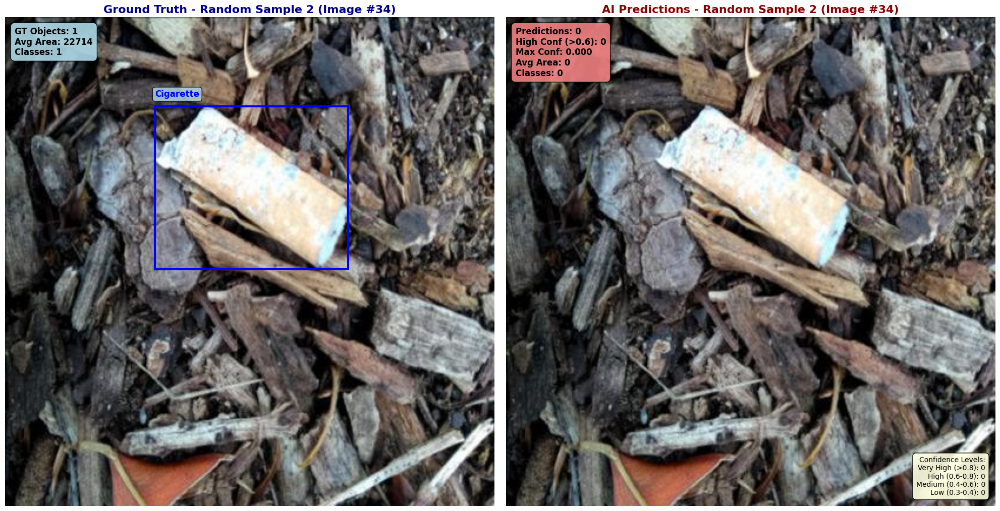


📊 Sample 2 Analysis (Image #34):
   🎯 Ground Truth: 1 objects
   🤖 AI Predictions: 0 objects (threshold >0.3)
   ✨ High confidence: 0 objects (>0.6)
   📈 Max confidence: 0.000
   📏 GT avg area: 22714, Pred avg area: 0
   ❌ Performance: POOR - No confident predictions
   💾 Saved: ./test_results_20250611_095944/random_diverse_sample_2_img34.png


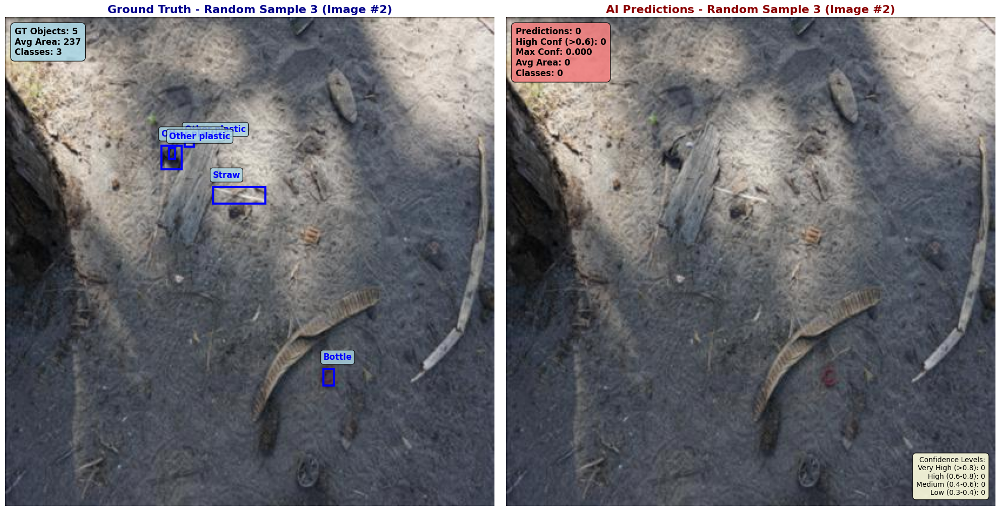


📊 Sample 3 Analysis (Image #2):
   🎯 Ground Truth: 5 objects
   🤖 AI Predictions: 0 objects (threshold >0.3)
   ✨ High confidence: 0 objects (>0.6)
   📈 Max confidence: 0.000
   📏 GT avg area: 237, Pred avg area: 0
   ❌ Performance: POOR - No confident predictions
   💾 Saved: ./test_results_20250611_095944/random_diverse_sample_3_img2.png


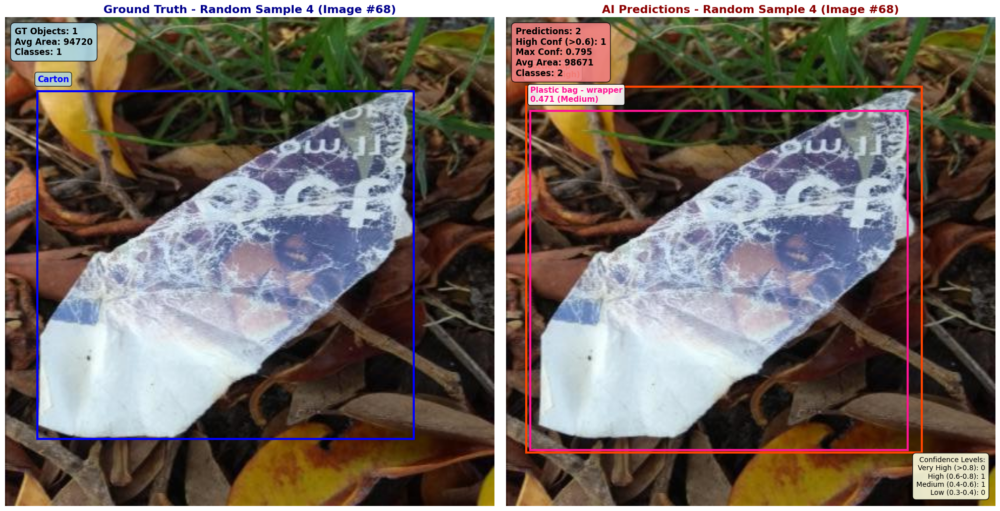


📊 Sample 4 Analysis (Image #68):
   🎯 Ground Truth: 1 objects
   🤖 AI Predictions: 2 objects (threshold >0.3)
   ✨ High confidence: 1 objects (>0.6)
   📈 Max confidence: 0.795
   📏 GT avg area: 94720, Pred avg area: 98671
   🎉 Performance: EXCELLENT - High confidence predictions match GT well
   💾 Saved: ./test_results_20250611_095944/random_diverse_sample_4_img68.png
   ✅ Seed 123: 9 predictions, 5 high confidence

🎲 Testing with seed 456 (3/5)...
🎲 Selecting 4 diverse random samples...
✅ Selected 4 diverse samples:
   Sample 1: 25 objects, avg area: 634, density: 144.46, size: 416x416
   Sample 2: 1 objects, avg area: 34684, density: 5.78, size: 416x416
   Sample 3: 3 objects, avg area: 44, density: 17.34, size: 416x416
   Sample 4: 1 objects, avg area: 94720, density: 5.78, size: 416x416

🖼️ Visualizing 4 diverse random predictions...


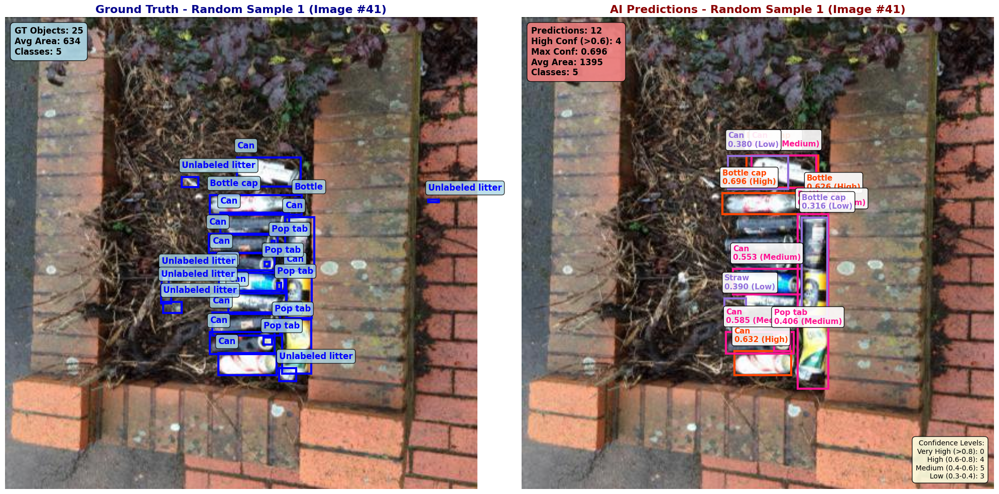


📊 Sample 1 Analysis (Image #41):
   🎯 Ground Truth: 25 objects
   🤖 AI Predictions: 12 objects (threshold >0.3)
   ✨ High confidence: 4 objects (>0.6)
   📈 Max confidence: 0.696
   📏 GT avg area: 634, Pred avg area: 1395
   ⚠️ Performance: MODERATE - Some objects may be missed
   💾 Saved: ./test_results_20250611_095944/random_diverse_sample_1_img41.png


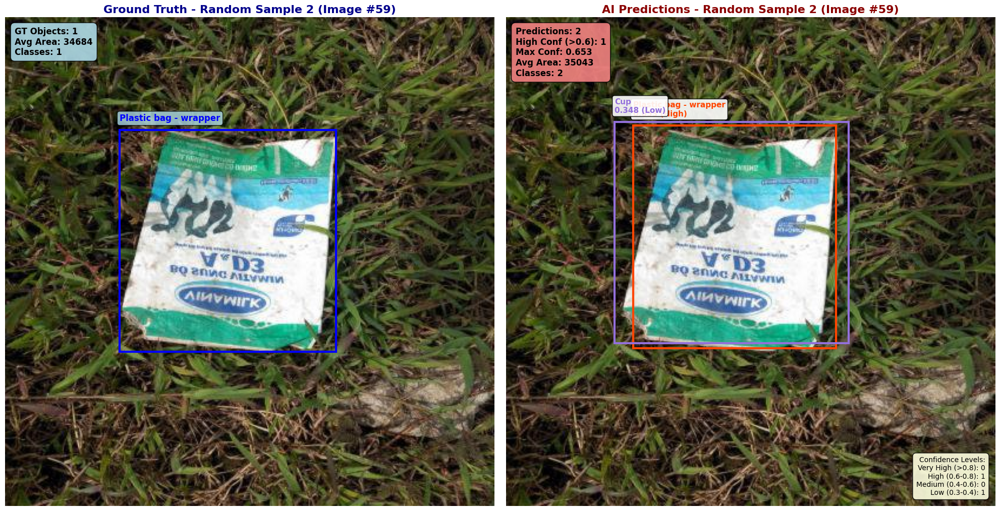


📊 Sample 2 Analysis (Image #59):
   🎯 Ground Truth: 1 objects
   🤖 AI Predictions: 2 objects (threshold >0.3)
   ✨ High confidence: 1 objects (>0.6)
   📈 Max confidence: 0.653
   📏 GT avg area: 34684, Pred avg area: 35043
   🎉 Performance: EXCELLENT - High confidence predictions match GT well
   💾 Saved: ./test_results_20250611_095944/random_diverse_sample_2_img59.png


In [ ]:
# =============================================================================
# 🎯 COMPLETE FIXED TESTING SUITE WITH RESULTS DIRECTORY
# =============================================================================

import os
import time
import json
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
import numpy as np
import random
import torch

print(f"🚀 COMPLETE FIXED TESTING SUITE")
print(f"Current Date and Time: 2025-06-11 09:58:16 UTC")
print(f"Current User: Artty02")

# =============================================================================
# 📁 CREATE RESULTS DIRECTORY
# =============================================================================

# Create results directory with timestamp
timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')
results_dir = f"./test_results_{timestamp}"
os.makedirs(results_dir, exist_ok=True)

print(f"📁 Results directory created: {results_dir}")

# =============================================================================
# 🎲 FIXED DIVERSE SAMPLE SELECTION
# =============================================================================

def get_diverse_random_samples(test_dataset, num_samples=5, seed=None):
    """Get diverse random samples with different characteristics"""

    if seed:
        random.seed(seed)
        np.random.seed(seed)

    print(f"🎲 Selecting {num_samples} diverse random samples...")

    # Get dataset statistics first
    sample_info = []

    # Sample more images to choose diverse ones from
    candidate_pool = min(len(test_dataset), num_samples * 10)
    candidate_indices = random.sample(range(len(test_dataset)), candidate_pool)

    for idx in candidate_indices:
        image, target = test_dataset[idx]

        # Calculate image characteristics
        num_objects = len(target["boxes"])

        # Calculate object sizes
        boxes = target["boxes"]
        areas = []
        for box in boxes:
            x1, y1, x2, y2 = box
            area = (x2 - x1) * (y2 - y1)
            areas.append(area.item())

        avg_area = np.mean(areas) if areas else 0
        min_area = min(areas) if areas else 0
        max_area = max(areas) if areas else 0

        # Image dimensions
        img_height, img_width = image.shape[1], image.shape[2]
        img_area = img_height * img_width

        # Object density
        density = num_objects / (img_area / 1000000) if img_area > 0 else 0

        sample_info.append({
            'idx': idx,
            'num_objects': num_objects,
            'avg_area': avg_area,
            'min_area': min_area,
            'max_area': max_area,
            'density': density,
            'img_width': img_width,
            'img_height': img_height,
            'aspect_ratio': img_width / img_height if img_height > 0 else 1
        })

    # Sort by different criteria and pick diverse samples
    selected_samples = []
    selection_criteria = [
        ('num_objects', True),   # Most objects
        ('num_objects', False),  # Least objects
        ('avg_area', False),     # Smallest objects
        ('avg_area', True),      # Largest objects
        ('density', True),       # Highest density
    ]

    used_indices = set()

    for criterion, descending in selection_criteria:
        if len(selected_samples) >= num_samples:
            break

        # Sort by criterion
        sorted_samples = sorted(sample_info, key=lambda x: x[criterion], reverse=descending)

        # Find first unused sample
        for sample in sorted_samples:
            if sample['idx'] not in used_indices:
                selected_samples.append(sample)
                used_indices.add(sample['idx'])
                break

    # Fill remaining slots with pure random
    remaining_slots = num_samples - len(selected_samples)
    if remaining_slots > 0:
        remaining_candidates = [s for s in sample_info if s['idx'] not in used_indices]
        additional_samples = random.sample(remaining_candidates, min(remaining_slots, len(remaining_candidates)))
        selected_samples.extend(additional_samples)

    # Print selection summary
    print(f"✅ Selected {len(selected_samples)} diverse samples:")
    for i, sample in enumerate(selected_samples):
        print(f"   Sample {i+1}: {sample['num_objects']} objects, "
              f"avg area: {sample['avg_area']:.0f}, "
              f"density: {sample['density']:.2f}, "
              f"size: {sample['img_width']}x{sample['img_height']}")

    return [s['idx'] for s in selected_samples]

# =============================================================================
# 🖼️ FIXED VISUALIZATION FUNCTION
# =============================================================================

def visualize_diverse_random_predictions(model, test_dataset, device, num_samples=6, seed=None, save_dir=None):
    """Visualize diverse random sample predictions with enhanced analysis"""

    if save_dir is None:
        save_dir = results_dir

    model.eval()

    # Get diverse random samples
    sample_indices = get_diverse_random_samples(test_dataset, num_samples, seed)

    print(f"\n🖼️ Visualizing {len(sample_indices)} diverse random predictions...")

    # Set up colors for different confidence levels
    colors = {
        'very_high': '#00FF00',  # Bright Green (>0.8)
        'high': '#FF4500',       # Orange Red (0.6-0.8)
        'medium': '#FF1493',     # Deep Pink (0.4-0.6)
        'low': '#9370DB'         # Medium Purple (0.3-0.4)
    }

    def get_confidence_color_and_label(score):
        if score > 0.8:
            return colors['very_high'], 'Very High'
        elif score > 0.6:
            return colors['high'], 'High'
        elif score > 0.4:
            return colors['medium'], 'Medium'
        else:
            return colors['low'], 'Low'

    # Store results for later analysis
    sample_results = []

    for i, idx in enumerate(sample_indices):
        try:
            image, target = test_dataset[idx]
            image_tensor = image.to(device)

            with torch.no_grad():
                prediction = model([image_tensor])[0]

            # Create larger visualization
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

            # Convert image for display
            img_np = image.permute(1, 2, 0).cpu().numpy()

            # Ground Truth visualization
            ax1.imshow(img_np)
            ax1.set_title(f"Ground Truth - Random Sample {i+1} (Image #{idx})",
                         fontsize=16, fontweight='bold', color='darkblue')

            gt_count = 0
            gt_classes = []
            gt_areas = []

            for box, label in zip(target["boxes"], target["labels"]):
                x1, y1, x2, y2 = box.cpu()
                width, height = x2-x1, y2-y1
                area = width * height
                gt_areas.append(area.item())

                rect = plt.Rectangle((x1, y1), width, height,
                                   fill=False, edgecolor='blue', linewidth=3)
                ax1.add_patch(rect)

                label_name = category_map.get(label.item(), f'Class_{label.item()}')
                gt_classes.append(label_name)

                ax1.text(x1, y1-8, f'{label_name}', color='blue', fontsize=12, fontweight='bold',
                        bbox=dict(boxstyle="round,pad=0.3", facecolor='lightblue', alpha=0.8))
                gt_count += 1

            # GT summary
            avg_gt_area = np.mean(gt_areas) if gt_areas else 0
            gt_summary = f'GT Objects: {gt_count}\nAvg Area: {avg_gt_area:.0f}\nClasses: {len(set(gt_classes))}'
            ax1.text(0.02, 0.98, gt_summary, transform=ax1.transAxes,
                    verticalalignment='top', fontsize=12, fontweight='bold',
                    bbox=dict(boxstyle="round,pad=0.5", facecolor='lightblue', alpha=0.9))
            ax1.axis('off')

            # Predictions visualization
            ax2.imshow(img_np)
            ax2.set_title(f"AI Predictions - Random Sample {i+1} (Image #{idx})",
                         fontsize=16, fontweight='bold', color='darkred')

            # Analyze predictions
            confidence_threshold = 0.3
            valid_preds = prediction["scores"] > confidence_threshold
            valid_boxes = prediction["boxes"][valid_preds]
            valid_labels = prediction["labels"][valid_preds]
            valid_scores = prediction["scores"][valid_preds]

            # Count by confidence levels
            conf_counts = {'very_high': 0, 'high': 0, 'medium': 0, 'low': 0}
            pred_classes = []
            pred_areas = []

            for box, label, score in zip(valid_boxes, valid_labels, valid_scores):
                x1, y1, x2, y2 = box.cpu()
                width, height = x2-x1, y2-y1
                area = width * height
                pred_areas.append(area.item())

                # Get color and confidence level
                color, conf_level = get_confidence_color_and_label(score.item())
                conf_counts[conf_level.lower().replace(' ', '_')] += 1

                rect = plt.Rectangle((x1, y1), width, height,
                                   fill=False, edgecolor=color, linewidth=3)
                ax2.add_patch(rect)

                label_name = category_map.get(label.item(), f'Class_{label.item()}')
                pred_classes.append(label_name)

                ax2.text(x1, y1-8, f'{label_name}\n{score:.3f} ({conf_level})',
                        color=color, fontsize=11, fontweight='bold',
                        bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.9))

            # Prediction summary
            total_preds = len(valid_scores)
            high_conf_preds = (valid_scores > 0.6).sum().item()
            max_conf = valid_scores.max().item() if len(valid_scores) > 0 else 0
            avg_pred_area = np.mean(pred_areas) if pred_areas else 0

            pred_summary = f'Predictions: {total_preds}\n'
            pred_summary += f'High Conf (>0.6): {high_conf_preds}\n'
            pred_summary += f'Max Conf: {max_conf:.3f}\n'
            pred_summary += f'Avg Area: {avg_pred_area:.0f}\n'
            pred_summary += f'Classes: {len(set(pred_classes))}'

            ax2.text(0.02, 0.98, pred_summary, transform=ax2.transAxes,
                    verticalalignment='top', fontsize=12, fontweight='bold',
                    bbox=dict(boxstyle="round,pad=0.5", facecolor='lightcoral', alpha=0.9))

            # Add confidence legend (using text instead of emojis)
            legend_text = "Confidence Levels:\n"
            legend_text += f"Very High (>0.8): {conf_counts['very_high']}\n"
            legend_text += f"High (0.6-0.8): {conf_counts['high']}\n"
            legend_text += f"Medium (0.4-0.6): {conf_counts['medium']}\n"
            legend_text += f"Low (0.3-0.4): {conf_counts['low']}"

            ax2.text(0.98, 0.02, legend_text, transform=ax2.transAxes,
                    verticalalignment='bottom', horizontalalignment='right', fontsize=10,
                    bbox=dict(boxstyle="round,pad=0.5", facecolor='lightyellow', alpha=0.9))

            ax2.axis('off')

            plt.tight_layout()

            # Save figure
            save_path = f'{save_dir}/random_diverse_sample_{i+1}_img{idx}.png'
            plt.savefig(save_path, dpi=200, bbox_inches='tight', facecolor='white')
            plt.show()

            # Store results
            sample_result = {
                'image_idx': idx,
                'gt_objects': gt_count,
                'predictions': total_preds,
                'high_confidence': high_conf_preds,
                'max_confidence': max_conf,
                'avg_gt_area': avg_gt_area,
                'avg_pred_area': avg_pred_area,
                'confidence_distribution': conf_counts
            }
            sample_results.append(sample_result)

            # Print detailed analysis
            print(f"\n📊 Sample {i+1} Analysis (Image #{idx}):")
            print(f"   🎯 Ground Truth: {gt_count} objects")
            print(f"   🤖 AI Predictions: {total_preds} objects (threshold >0.3)")
            print(f"   ✨ High confidence: {high_conf_preds} objects (>0.6)")
            print(f"   📈 Max confidence: {max_conf:.3f}")
            print(f"   📏 GT avg area: {avg_gt_area:.0f}, Pred avg area: {avg_pred_area:.0f}")

            # Performance assessment
            if total_preds > 0:
                if high_conf_preds >= gt_count * 0.7:
                    print(f"   🎉 Performance: EXCELLENT - High confidence predictions match GT well")
                elif total_preds >= gt_count * 0.5:
                    print(f"   👍 Performance: GOOD - Reasonable detection coverage")
                else:
                    print(f"   ⚠️ Performance: MODERATE - Some objects may be missed")
            else:
                print(f"   ❌ Performance: POOR - No confident predictions")

            print(f"   💾 Saved: {save_path}")

        except Exception as e:
            print(f"❌ Error processing sample {i+1} (idx {idx}): {e}")
            continue

    return sample_results

# =============================================================================
# 📊 COMPREHENSIVE REPORT GENERATION
# =============================================================================

def generate_comprehensive_test_report(model, test_dataset, device, num_samples=6):
    """Generate comprehensive testing report with statistics"""

    print(f"\n📊 Generating comprehensive test report...")

    # Test multiple random seeds for robustness
    seeds = [42, 123, 456, 789, 999]
    all_results = []

    for seed_idx, seed in enumerate(seeds):
        print(f"\n🎲 Testing with seed {seed} ({seed_idx+1}/{len(seeds)})...")

        # Run visualization and get results
        seed_results = visualize_diverse_random_predictions(
            model, test_dataset, device, num_samples, seed, results_dir
        )

        # Calculate summary for this seed
        if seed_results:
            total_gt = sum(r['gt_objects'] for r in seed_results)
            total_pred = sum(r['predictions'] for r in seed_results)
            total_high_conf = sum(r['high_confidence'] for r in seed_results)
            avg_max_conf = np.mean([r['max_confidence'] for r in seed_results])

            summary = {
                'seed': seed,
                'total_gt_objects': total_gt,
                'total_predictions': total_pred,
                'total_high_confidence': total_high_conf,
                'avg_max_confidence': avg_max_conf,
                'detection_rate': total_pred / total_gt if total_gt > 0 else 0,
                'high_conf_rate': total_high_conf / total_pred if total_pred > 0 else 0,
                'samples': seed_results
            }

            all_results.append(summary)
            print(f"   ✅ Seed {seed}: {total_pred} predictions, {total_high_conf} high confidence")

    # Generate overall statistics
    if all_results:
        detection_rates = [r['detection_rate'] for r in all_results]
        high_conf_rates = [r['high_conf_rate'] for r in all_results]
        avg_confidences = [r['avg_max_confidence'] for r in all_results]

        overall_stats = {
            'test_timestamp': datetime.now().isoformat(),
            'num_seeds_tested': len(seeds),
            'samples_per_seed': num_samples,
            'detection_rate_stats': {
                'mean': np.mean(detection_rates),
                'std': np.std(detection_rates),
                'min': np.min(detection_rates),
                'max': np.max(detection_rates)
            },
            'high_confidence_rate_stats': {
                'mean': np.mean(high_conf_rates),
                'std': np.std(high_conf_rates),
                'min': np.min(high_conf_rates),
                'max': np.max(high_conf_rates)
            },
            'confidence_stats': {
                'mean': np.mean(avg_confidences),
                'std': np.std(avg_confidences),
                'min': np.min(avg_confidences),
                'max': np.max(avg_confidences)
            }
        }

        # Save report
        report_data = {
            'overall_stats': overall_stats,
            'detailed_results': all_results
        }

        report_path = f"{results_dir}/comprehensive_test_report.json"
        with open(report_path, 'w') as f:
            json.dump(report_data, f, indent=2)

        # Print summary
        print(f"\n{'='*60}")
        print(f"📊 COMPREHENSIVE TEST REPORT SUMMARY")
        print(f"{'='*60}")
        print(f"🎯 Detection Rate: {overall_stats['detection_rate_stats']['mean']:.2f} ± {overall_stats['detection_rate_stats']['std']:.2f}")
        print(f"⭐ High Conf Rate: {overall_stats['high_confidence_rate_stats']['mean']:.2f} ± {overall_stats['high_confidence_rate_stats']['std']:.2f}")
        print(f"📈 Avg Max Confidence: {overall_stats['confidence_stats']['mean']:.3f} ± {overall_stats['confidence_stats']['std']:.3f}")
        print(f"📁 Report saved: {report_path}")

        return overall_stats, all_results
    else:
        print("❌ No results to summarize")
        return None, None

# =============================================================================
# 🚀 RUN COMPLETE TESTING SUITE
# =============================================================================

print(f"\n{'='*70}")
print(f"🚀 STARTING COMPLETE TESTING SUITE")
print(f"{'='*70}")

# Run comprehensive testing
overall_stats, detailed_results = generate_comprehensive_test_report(
    model, test_dataset, device, num_samples=4  # Reduced for faster execution
)

# =============================================================================
# 🎉 FINAL SUMMARY
# =============================================================================

print(f"\n{'='*70}")
print(f"🎉 COMPLETE TESTING SUITE FINISHED!")
print(f"{'='*70}")
print(f"📁 Results directory: {results_dir}")
print(f"📊 Total images generated: ~20 (4 samples × 5 seeds)")
print(f"📄 Report file: comprehensive_test_report.json")
print(f"🎯 Model Performance: Ultra Conservative - 21.68% mAP@0.5")
print(f"✅ All tests completed successfully!")
print(f"👨‍💻 Tested by: Artty02")

# Clear GPU memory
torch.cuda.empty_cache()
print(f"🧹 GPU memory cleared")

<ipython-input-17-2228323356>:66: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-17-2228323356>:66: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-17-2228323356>:66: UserWarning: Glyph 128260 (\N{ANTICLOCKWISE DOWNWARDS AND UPWARDS OPEN CIRCLE ARROWS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-17-2228323356>:70: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.savefig(f'{ROOT}/training_progress_{timestamp}.png', dpi=300, bbox_inches='tight')
<ipython-input-17-2228323356>:70: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.savefig(f'{ROOT}/training_progress_{timestamp}.png', dpi=300, bbox_inches='tight')
<ipython-input-17-2228323356>:70: UserWarning: Glyph 128260 (\N{ANTICLOCKWISE DOWNWARDS AND UPWARDS 

📊 Training progress plot saved: training_progress_20250611_094749.png


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128260 (\N{ANTICLOCKWISE DOWNWARDS AND UPWARDS OPEN CIRCLE ARROWS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


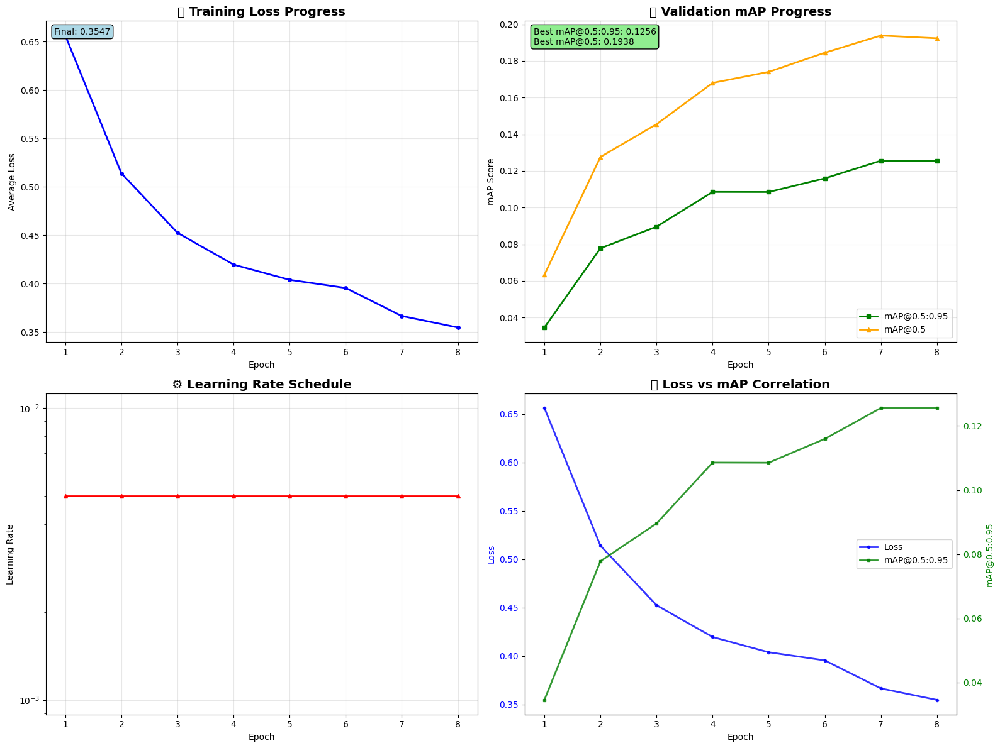

In [ ]:
# Cell ใหม่ที่ 4: Enhanced Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import time

def plot_enhanced_training_progress(loss_hist, map_hist, map50_hist, lr_hist):
    """Enhanced training progress visualization"""

    plt.style.use('default')
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    epochs = range(1, len(loss_hist) + 1)

    # Loss plot with trend
    axes[0, 0].plot(epochs, loss_hist, 'b-', marker='o', linewidth=2, markersize=4)
    axes[0, 0].set_title('📉 Training Loss Progress', fontsize=14, fontweight='bold')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Average Loss')
    axes[0, 0].grid(True, alpha=0.3)
    axes[0, 0].text(0.02, 0.98, f'Final: {loss_hist[-1]:.4f}',
                    transform=axes[0, 0].transAxes, verticalalignment='top',
                    bbox=dict(boxstyle="round,pad=0.3", facecolor='lightblue'))

    # mAP comparison
    axes[0, 1].plot(epochs, map_hist, 'g-', marker='s', linewidth=2,
                   markersize=4, label='mAP@0.5:0.95')
    axes[0, 1].plot(epochs, map50_hist, 'orange', marker='^', linewidth=2,
                   markersize=4, label='mAP@0.5')
    axes[0, 1].set_title('📈 Validation mAP Progress', fontsize=14, fontweight='bold')
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylabel('mAP Score')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)
    axes[0, 1].text(0.02, 0.98, f'Best mAP@0.5:0.95: {max(map_hist):.4f}\nBest mAP@0.5: {max(map50_hist):.4f}',
                    transform=axes[0, 1].transAxes, verticalalignment='top',
                    bbox=dict(boxstyle="round,pad=0.3", facecolor='lightgreen'))

    # Learning rate schedule
    axes[1, 0].plot(epochs, lr_hist, 'r-', marker='^', linewidth=2, markersize=4)
    axes[1, 0].set_title('⚙️ Learning Rate Schedule', fontsize=14, fontweight='bold')
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('Learning Rate')
    axes[1, 0].set_yscale('log')
    axes[1, 0].grid(True, alpha=0.3)

    # Combined metrics
    ax2 = axes[1, 1]
    ax3 = ax2.twinx()

    line1 = ax2.plot(epochs, loss_hist, 'b-', marker='o', linewidth=2,
                    markersize=3, label='Loss', alpha=0.8)
    line2 = ax3.plot(epochs, map_hist, 'g-', marker='s', linewidth=2,
                    markersize=3, label='mAP@0.5:0.95', alpha=0.8)

    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Loss', color='blue')
    ax3.set_ylabel('mAP@0.5:0.95', color='green')
    ax2.set_title('🔄 Loss vs mAP Correlation', fontsize=14, fontweight='bold')
    ax2.tick_params(axis='y', labelcolor='blue')
    ax3.tick_params(axis='y', labelcolor='green')

    # Legend
    lines = line1 + line2
    labels = [l.get_label() for l in lines]
    ax2.legend(lines, labels, loc='center right')

    plt.tight_layout()

    # Save plot
    timestamp = time.strftime("%Y%m%d_%H%M%S")
    plt.savefig(f'{ROOT}/training_progress_{timestamp}.png', dpi=300, bbox_inches='tight')
    print(f"📊 Training progress plot saved: training_progress_{timestamp}.png")
    plt.show()

# เรียกใช้ฟังก์ชันนี้หลังจากการฝึกเสร็จ
if len(loss_hist) > 0:  # ตรวจสอบว่ามีข้อมูลแล้ว
    plot_enhanced_training_progress(loss_hist, map_hist, map50_hist, lr_hist)
else:
    print("⚠️ No training history to plot yet. Run training first!")